In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import *
import seaborn as sns
import numpy as np


In [ ]:
!wget https://raw.githubusercontent.com/davidlealo/tallermodelossupervisados/refs/heads/main/data/Lluvia_full.csv

--2025-07-05 14:49:15--  https://raw.githubusercontent.com/davidlealo/tallermodelossupervisados/refs/heads/main/data/Lluvia_full.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5978975 (5.7M) [text/plain]
Saving to: ‘Lluvia_full.csv.1’

Lluvia_full.csv.1   100%[===================>]   5.70M  --.-KB/s    in 0.09s   

2025-07-05 14:49:15 (60.7 MB/s) - ‘Lluvia_full.csv.1’ saved [5978975/5978975]



In [ ]:
df = pd.read_csv('Lluvia_full.csv')
print(df)

       MinTemp  MaxTemp  Lluvia  Evaporacion   Sol  VelRafaga  Vel9am  Vel3pm  \
0          7.6     19.3     0.0          3.4   9.4       35.0    13.0    13.0   
1          6.8     19.5     0.0          3.4   9.4       46.0    19.0    28.0   
2          5.5     13.9     0.0          2.8   3.8       44.0    26.0    13.0   
3          8.6     14.3     0.0          2.8   3.8       35.0    13.0    17.0   
4          7.9     13.0     0.0          2.8   3.8       39.0    15.0    17.0   
...        ...      ...     ...          ...   ...        ...     ...     ...   
56415      7.6     16.1     2.8          5.6  10.6       50.0    20.0    28.0   
56416     13.3     15.5    39.8          7.2   9.1       54.0    30.0    24.0   
56417     13.7     23.4     3.6          5.8   3.3       85.0     6.0     6.0   
56418     14.0     26.9     3.6          4.4   9.7       39.0     4.0    17.0   
56419      8.0     24.3     0.0          3.4   6.3       30.0     6.0    20.0   

       Hum9am  Hum3pm  Pres

In [ ]:
df.isnull().sum()

,0
MinTemp,0
MaxTemp,0
Lluvia,0
Evaporacion,0
Sol,0
VelRafaga,0
Vel9am,0
Vel3pm,0
Hum9am,0
Hum3pm,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56420 entries, 0 to 56419
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MinTemp      56420 non-null  float64
 1   MaxTemp      56420 non-null  float64
 2   Lluvia       56420 non-null  float64
 3   Evaporacion  56420 non-null  float64
 4   Sol          56420 non-null  float64
 5   VelRafaga    56420 non-null  float64
 6   Vel9am       56420 non-null  float64
 7   Vel3pm       56420 non-null  float64
 8   Hum9am       56420 non-null  float64
 9   Hum3pm       56420 non-null  float64
 10  Pres9am      56420 non-null  float64
 11  Pre3pm       56420 non-null  float64
 12  Nub9am       56420 non-null  float64
 13  Nub3pm       56420 non-null  float64
 14  Temp9am      56420 non-null  float64
 15  Temp3pm      56420 non-null  float64
 16  LluviaHoy    56420 non-null  object 
 17  LluviaMan    56420 non-null  object 
 18  Koppen       56420 non-null  object 
 19  Esta

In [ ]:
df['Koppen'].unique()

array(['Subtropical', 'Temperate', 'Grassland', 'Desert'], dtype=object)

In [ ]:
df.Estacion.unique()

array(['Invierno', 'Otoño', 'Verano', 'Primavera'], dtype=object)

In [ ]:
df = df.replace('Yes',1)
df = df.replace('No', 0)

/tmp/ipython-input-28-2429336795.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace('No', 0)


In [ ]:
df

,MinTemp,MaxTemp,Lluvia,Evaporacion,Sol,VelRafaga,Vel9am,Vel3pm,Hum9am,Hum3pm,Pres9am,Pre3pm,Nub9am,Nub3pm,Temp9am,Temp3pm,LluviaHoy,LluviaMan,Koppen,Estacion
0,7.6,19.3,0.0,3.4,9.4,35.0,13.0,13.0,73.0,32.0,1018.6,1015.4,1.0,1.0,9.4,18.8,0,0,Subtropical,Invierno
1,6.8,19.5,0.0,3.4,9.4,46.0,19.0,28.0,67.0,42.0,1018.4,1015.2,1.0,1.0,11.9,17.9,0,0,Subtropical,Invierno
2,5.5,13.9,0.0,2.8,3.8,44.0,26.0,13.0,72.0,58.0,1017.8,1015.5,7.0,7.0,8.1,12.2,0,0,Temperate,Invierno
3,8.6,14.3,0.0,2.8,3.8,35.0,13.0,17.0,67.0,56.0,1017.4,1015.0,7.0,7.0,9.3,13.4,0,1,Temperate,Invierno
4,7.9,13.0,0.0,2.8,3.8,39.0,15.0,17.0,68.0,69.0,1017.6,1015.3,7.0,7.0,9.0,11.7,0,0,Temperate,Invierno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56415,7.6,16.1,2.8,5.6,10.6,50.0,20.0,28.0,68.0,49.0,1018.3,1018.5,7.0,7.0,11.1,15.4,1,0,Temperate,Primavera
56416,13.3,15.5,39.8,7.2,9.1,54.0,30.0,24.0,62.0,56.0,1005.5,1007.0,2.0,7.0,13.5,14.1,1,1,Temperate,Primavera
56417,13.7,23.4,3.6,5.8,3.3,85.0,6.0,6.0,82.0,69.0,1009.5,1007.2,8.0,7.0,15.4,20.2,1,1,Temperate,Primavera
56418,14.0,26.9,3.6,4.4,9.7,39.0,4.0,17.0,80.0,36.0,1012.4,1008.4,5.0,3.0,17.5,25.7,1,1,Temperate,Primavera


In [ ]:
df

,MinTemp,MaxTemp,Lluvia,Evaporacion,Sol,VelRafaga,Vel9am,Vel3pm,Hum9am,Hum3pm,Pres9am,Pre3pm,Nub9am,Nub3pm,Temp9am,Temp3pm,LluviaHoy,LluviaMan,Koppen,Estacion
0,7.6,19.3,0.0,3.4,9.4,35.0,13.0,13.0,73.0,32.0,1018.6,1015.4,1.0,1.0,9.4,18.8,0,0,Subtropical,Invierno
1,6.8,19.5,0.0,3.4,9.4,46.0,19.0,28.0,67.0,42.0,1018.4,1015.2,1.0,1.0,11.9,17.9,0,0,Subtropical,Invierno
2,5.5,13.9,0.0,2.8,3.8,44.0,26.0,13.0,72.0,58.0,1017.8,1015.5,7.0,7.0,8.1,12.2,0,0,Temperate,Invierno
3,8.6,14.3,0.0,2.8,3.8,35.0,13.0,17.0,67.0,56.0,1017.4,1015.0,7.0,7.0,9.3,13.4,0,1,Temperate,Invierno
4,7.9,13.0,0.0,2.8,3.8,39.0,15.0,17.0,68.0,69.0,1017.6,1015.3,7.0,7.0,9.0,11.7,0,0,Temperate,Invierno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56415,7.6,16.1,2.8,5.6,10.6,50.0,20.0,28.0,68.0,49.0,1018.3,1018.5,7.0,7.0,11.1,15.4,1,0,Temperate,Primavera
56416,13.3,15.5,39.8,7.2,9.1,54.0,30.0,24.0,62.0,56.0,1005.5,1007.0,2.0,7.0,13.5,14.1,1,1,Temperate,Primavera
56417,13.7,23.4,3.6,5.8,3.3,85.0,6.0,6.0,82.0,69.0,1009.5,1007.2,8.0,7.0,15.4,20.2,1,1,Temperate,Primavera
56418,14.0,26.9,3.6,4.4,9.7,39.0,4.0,17.0,80.0,36.0,1012.4,1008.4,5.0,3.0,17.5,25.7,1,1,Temperate,Primavera


In [ ]:
# prompt: Create onehotencoding using the skitlearn library of the 'Estacion' and 'Koppen' columns

from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')
encoder_df = pd.DataFrame(encoder.fit_transform(df[['Estacion','Koppen']]).toarray())
encoder_df.columns = encoder.get_feature_names_out(['Estacion','Koppen'])
df = df.join(encoder_df)
df = df.drop(['Estacion', 'Koppen'], axis=1)
df

,MinTemp,MaxTemp,Lluvia,Evaporacion,Sol,VelRafaga,Vel9am,Vel3pm,Hum9am,Hum3pm,...,LluviaHoy,LluviaMan,Estacion_Invierno,Estacion_Otoño,Estacion_Primavera,Estacion_Verano,Koppen_Desert,Koppen_Grassland,Koppen_Subtropical,Koppen_Temperate
0,7.6,19.3,0.0,3.4,9.4,35.0,13.0,13.0,73.0,32.0,...,0,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,6.8,19.5,0.0,3.4,9.4,46.0,19.0,28.0,67.0,42.0,...,0,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,5.5,13.9,0.0,2.8,3.8,44.0,26.0,13.0,72.0,58.0,...,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,8.6,14.3,0.0,2.8,3.8,35.0,13.0,17.0,67.0,56.0,...,0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,7.9,13.0,0.0,2.8,3.8,39.0,15.0,17.0,68.0,69.0,...,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56415,7.6,16.1,2.8,5.6,10.6,50.0,20.0,28.0,68.0,49.0,...,1,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
56416,13.3,15.5,39.8,7.2,9.1,54.0,30.0,24.0,62.0,56.0,...,1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
56417,13.7,23.4,3.6,5.8,3.3,85.0,6.0,6.0,82.0,69.0,...,1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
56418,14.0,26.9,3.6,4.4,9.7,39.0,4.0,17.0,80.0,36.0,...,1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
X = df.drop('LluviaMan', axis=1)
y = df['LluviaMan']
display(X)

,MinTemp,MaxTemp,Lluvia,Evaporacion,Sol,VelRafaga,Vel9am,Vel3pm,Hum9am,Hum3pm,...,Temp3pm,LluviaHoy,Estacion_Invierno,Estacion_Otoño,Estacion_Primavera,Estacion_Verano,Koppen_Desert,Koppen_Grassland,Koppen_Subtropical,Koppen_Temperate
0,7.6,19.3,0.0,3.4,9.4,35.0,13.0,13.0,73.0,32.0,...,18.8,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,6.8,19.5,0.0,3.4,9.4,46.0,19.0,28.0,67.0,42.0,...,17.9,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,5.5,13.9,0.0,2.8,3.8,44.0,26.0,13.0,72.0,58.0,...,12.2,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,8.6,14.3,0.0,2.8,3.8,35.0,13.0,17.0,67.0,56.0,...,13.4,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,7.9,13.0,0.0,2.8,3.8,39.0,15.0,17.0,68.0,69.0,...,11.7,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56415,7.6,16.1,2.8,5.6,10.6,50.0,20.0,28.0,68.0,49.0,...,15.4,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
56416,13.3,15.5,39.8,7.2,9.1,54.0,30.0,24.0,62.0,56.0,...,14.1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
56417,13.7,23.4,3.6,5.8,3.3,85.0,6.0,6.0,82.0,69.0,...,20.2,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
56418,14.0,26.9,3.6,4.4,9.7,39.0,4.0,17.0,80.0,36.0,...,25.7,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
display(y)

,LluviaMan
0,0
1,0
2,0
3,1
4,0
...,...
56415,0
56416,1
56417,1
56418,1


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.87      0.87      8853
           1       0.54      0.56      0.55      2431

    accuracy                           0.80     11284
   macro avg       0.71      0.71      0.71     11284
weighted avg       0.80      0.80      0.80     11284



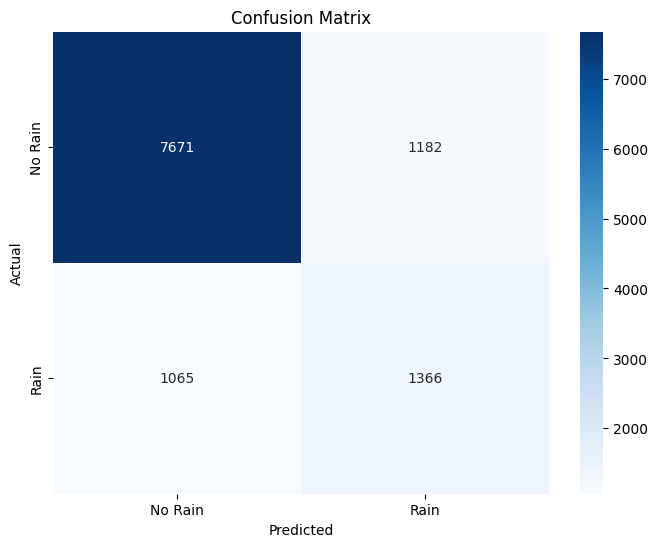

In [ ]:
# prompt: crear una matriz de confusion de la predicción anterior

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Rain', 'Rain'], yticklabels=['No Rain', 'Rain'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import graphviz
from sklearn.tree import export_graphviz

# Generar datos en formato DOT
dot_data = export_graphviz(clf, out_file=None,
                           feature_names=X.columns,
                           class_names=[str(c) for c in clf.classes_],
                           filled=True, rounded=True,
                           special_characters=True)

# Crear y mostrar el gráfico
graph = graphviz.Source(dot_data)
graph.render("LluviaMan_decision_tree", format="pdf", cleanup=True)
graph

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, KFold

# Definir el estimador base
estimator = DecisionTreeClassifier()

# Definir el espacio de búsqueda de hiperparámetros
parameters = {
    'max_depth': [4, 6, 8, 10, 12],
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3],
    'random_state': [7, 23, 42, 78, 142],
    'min_impurity_decrease': [0.0, 0.05, 0.1, 0.2]
}

# Configurar la búsqueda en malla con validación cruzada
model2 = GridSearchCV(
    estimator=estimator,
    param_grid=parameters,
    cv=KFold(10),
    verbose=1,
    n_jobs=-1,
    refit=True
)

# Ajustar el modelo con los mejores hiperparámetros encontrados
model2.fit(X_train, y_train)


Fitting 10 folds for each of 1600 candidates, totalling 16000 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 6, 8, 10, 12],
                         'min_impurity_decrease': [0.0, 0.05, 0.1, 0.2],
                         'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3],
                         'random_state': [7, 23, 42, 78, 142],
                         'splitter': ['best', 'random']},
             verbose=1)

In [ ]:
# Mejor estimador encontrado
model2.best_estimator_

DecisionTreeClassifier(max_depth=6, random_state=42)

In [ ]:

# Mejores hiperparámetros encontrados
model2.best_params_


{'criterion': 'gini',
 'max_depth': 6,
 'min_impurity_decrease': 0.0,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 42,
 'splitter': 'best'}

In [ ]:

# Mejor puntaje promedio de validación cruzada
model2.best_score_

np.float64(0.8459098860859895)

In [ ]:
from sklearn.metrics import accuracy_score

# Realizar predicciones sobre el conjunto de prueba
pred = model2.predict(X_test)

# Ver las predicciones
pred


array([0, 0, 0, ..., 0, 1, 0])

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Usar el mejor modelo (árbol) encontrado por GridSearchCV
best_model = model2.best_estimator_

# Generar datos en formato DOT
dot_data = export_graphviz(best_model, out_file=None,
                           feature_names=X.columns,
                           class_names=[str(c) for c in clf.classes_],
                           filled=True, rounded=True,
                           special_characters=True)

# Crear y mostrar el gráfico
graph = graphviz.Source(dot_data)
graph.render("iris_best_decision_tree", format="pdf", cleanup=True)
graph

In [ ]:
# Report de metricas de model2
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))


              precision    recall  f1-score   support

           0       0.87      0.95      0.91      8853
           1       0.73      0.48      0.57      2431

    accuracy                           0.85     11284
   macro avg       0.80      0.71      0.74     11284
weighted avg       0.84      0.85      0.84     11284



In [ ]:
!pip install scikit-plot

In [ ]:

from sklearn.metrics import confusion_matrix

# Realizar predicciones
pred = model2.predict(X_test)

# Calcular la matriz de confusión
confusion_matrix(y_test, pred)


array([[8416,  437],
       [1276, 1155]])

In [ ]:
!pip install --upgrade scipy==1.9.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.4/33.4 MB 61.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 106.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.25.2 which is incompatible.
albumentations 2.0.8 requires scipy>=1.10.0, but you have scipy 1.9.3 which is incompatible.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.9.3 which is inco

In [1]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_test, pred, figsize=(8,6))
plt.show()


ModuleNotFoundError: No module named 'scikitplot'